<h1 align="center">Volume 2: The Fourier Transform.</h1>

    Brent A. Thorne
    Math 425
    12 May 2022

<h2 align="center">Part 1: The Discrete Fourier Transform</h2>

In [1]:
from matplotlib import pyplot as plt
from scipy.io import wavfile
import numpy as np
from scipy.fft import fft, ifft, fft2, ifft2
from scipy.signal import fftconvolve
import imageio
import IPython

In [2]:
plt.rcParams["figure.dpi"] = 300             # Fix plot quality.
plt.rcParams["figure.figsize"] = (12,3)      # Change plot size / aspect (you may adjust this).

In [3]:
class SoundWave(object):
    """A class for working with digital audio signals."""

    # Problem 1.1
    def __init__(self, rate, samples):
        """Set the SoundWave class attributes.

        Parameters:
            rate (int): The sample rate of the sound.
            samples ((n,) ndarray): NumPy array of samples.
        """
        self.rate = rate
        self.samples = samples

    # Problems 1.1 and 1.7
    def plot(self, DFT=False, Fmax=None):
        """Plot the graph of the sound wave (time versus amplitude)."""
        if (DFT==False):
            plt.plot( np.arange(len(self.samples))/rate, self.samples,  linewidth=.1)
            plt.ylim([-32768, 32767])
            plt.grid()
        else:
            if (Fmax==None):
                Fmax = self.rate/2
            F = fft(self.samples)
            v = np.arange(len(F)) * self.rate/len(F)
            plt.plot(v, abs(F))
            plt.xlim([0, Fmax])
        #raise NotImplementedError("Problem 1.1 Incomplete")

    # Problem 1.2
    def export(self, filename, force=False):
        """Generate a wav file from the sample rate and samples. 
        If the array of samples is not of type np.int16, scale it before exporting.

        Parameters:
            filename (str): The name of the wav file to export the sound to.
        """
        
        if type(self.samples.dtype) !=  'int16': 
            print(f'Forcing to int16 due to type mismatch! {self.samples.dtype}')
            force=True

        if force == False:
            wavfile.write(filename, self.rate, self.samples)
        else:
            wavfile.write(filename, self.rate, \
                          np.int16(self.samples/max(self.samples) * 32767))
    
    # Problem 1.4
    def __add__(self, other):
        """Combine the samples from two SoundWave objects.

        Parameters:
            other (SoundWave): An object containing the samples to add
                to the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the combined samples.

        Raises:
            ValueError: if the two sample arrays are not the same length.
        """
        if (len(self.samples) != len(other.samples)):
            raise ValueError('Sample Length Mismatch.')

        
        return SoundWave(self.rate, self.samples + other.samples)                            

    # Problem 1.4
    def __rshift__(self, other):
        """Concatentate the samples from two SoundWave objects.

        Parameters:
            other (SoundWave): An object containing the samples to concatenate
                to the samples contained in this object.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        if (self.rate) != other.rate:
            raise ValueError('Rate Mismatch.')
        return SoundWave(self.rate, np.append(self.samples,other.samples) )
        #raise NotImplementedError("Problem 1.4 Incomplete")
    
    # Problem 2.1
    def __mul__(self, other):
        """Convolve the samples from two SoundWave objects using circular convolution.
        
        Parameters:
            other (SoundWave): An object containing the samples to convolve
                with the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the convolved samples.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        if (self.rate) != other.rate:
            raise ValueError('Rate Mismatch.')
            
        if (len(self.samples) >= len(other.samples)):
            return SoundWave(self.rate, ifft( \
                             fft(self.samples) * \
                             fft(np.append(other.samples, \
                                       np.zeros(len(self.samples)-len(other.samples)) ))).real)
        else:
            return SoundWave(self.rate, ifft( \
                             fft(other.samples) * \
                             fft(np.append(self.samples, \
                                       np.zeros(len(other.samples)-len(self.samples)) ))).real)
    # Problem 2.2
    def __pow__(self, other):
        """Convolve the samples from two SoundWave objects using linear convolution.
        
        Parameters:
            other (SoundWave): An object containing the samples to convolve
                with the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the convolved samples.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        if (self.rate) != other.rate:
            raise ValueError('Rate Mismatch.')
            
        a = len(self.samples) + len(other.samples) - 1
        l = int(2** np.ceil(np.log(a)/np.log(2)))
        return SoundWave(self.rate, ifft( \
                             fft(np.append(self.samples, np.zeros(l-len(self.samples)))) * \
                             fft(np.append(other.samples, \
                                           np.zeros(l-len(other.samples)))) ).real[:a])

    # Problem 2.4
    def clean(self, low_freq, high_freq):
        """Remove a range of frequencies from the samples using the DFT. 

        Parameters:
            low_freq (float): Lower bound of the frequency range to zero out.
            high_freq (float): Higher boound of the frequency range to zero out.
        """
        
        # recall v=kr/n thus index k=vn/r  
        
        F = fft(self.samples)
        n = len(F)
        k_lo = int(low_freq * n/self.rate)
        k_hi = int(high_freq * n/self.rate)
        nyq = int(n/2)

        for i in [range(k_lo,k_hi),range(n-k_hi,n-k_lo)]:
            F[i] = 0.0

        self.samples = ifft(F).real
        np.int16(self.samples/max(self.samples) * 32767) # scale audio

### Problem 1.1

- Implement `SoundWave.__init__()`.
- Implement `SoundWave.plot()`.
- Use the `scipy.io.wavfile.read()` and the `SoundWave` class to plot `tada.wav`.

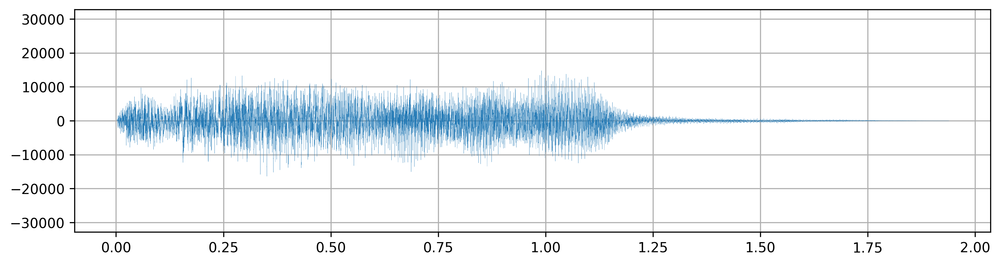

In [4]:
rate, samples = wavfile.read("tada.wav")
wave = SoundWave(rate, samples)
wave.plot()

### Problem 1.2

- Implement `SoundWave.export()`.
- Use the `export()` method to create two new files containing the same sound as `tada.wav`: one without scaling, and one with scaling (use `force=True`).
- Use `IPython.display.Audio()` to embed the original and new versions of `tada.wav` in the notebook.

In [5]:
wave.export("foo.wav")

Forcing to int16 due to type mismatch! int16


In [6]:
wave.export("foo2.wav", force=True)

Forcing to int16 due to type mismatch! int16


In [7]:
print("orginal")
IPython.display.Audio(filename="foo.wav")

orginal


In [8]:
print("new")
IPython.display.Audio(filename="foo2.wav")

new


### Problem 1.3

- Implement `generate_note()`.
- Use `generate_note()` to create an A tone that lasts for two seconds. Embed it in the notebook.

In [9]:
notes = {'A':440, 'B':493.88, 'C':523.25, 'D':587.33, 'E':659.25, 'F':698.46, 'G':783.99}
def generate_note(frequency, duration):
    """Generate an instance of the SoundWave class corresponding to 
    the desired soundwave. Uses sample rate of 44100 Hz.
    
    Parameters:
        frequency (float): The frequency of the desired sound.
        duration (float): The length of the desired sound in seconds.
    
    Returns:
        sound (SoundWave): An instance of the SoundWave class.
    """
    k = frequency
    rate = 44100
    l = duration*rate
    x = np.arange(l)/rate
    sample = np.sin(2*np.pi*x*k)
    return rate, sample

In [10]:
rate, samples = generate_note(440, 2)
note = SoundWave(rate, samples)
#note.export('a.wav')
#IPython.display.Audio(filename="a.wav")
IPython.display.Audio(note.samples, rate=note.rate)

### Problem 1.4

- Implement `SoundWave.__add__()`.
- Generate a three-second A minor chord (A, C, and E) and embed it in the notebook.
- Implement `SoundWave.__rshift__()`.
- Generate the arpeggio A$\,\rightarrow\,$C$\,\rightarrow\,$E, where each tone lasts one second, and embed it in the notebook.

Note Frequency (Hz)
A 440
B 493.88
C 523.25
D 587.33
E 659.25
F 698.46
G 783.99
A 880


In [11]:
noteA = SoundWave(*generate_note(440, 3)) # '*' is the unpacking operator
noteC = SoundWave(*generate_note(523.25, 3)) 
noteE = SoundWave(*generate_note(659.25, 3))
noteAm = noteA+noteC+noteE
IPython.display.Audio(noteAm.samples, rate=noteAm.rate)

In [12]:
noteA = SoundWave(*generate_note(440, 1)) # '*' is the unpacking operator
noteC = SoundWave(*generate_note(523.25, 1)) 
noteE = SoundWave(*generate_note(659.25, 1))
noteArpeg = noteA>>noteC>>noteE
IPython.display.Audio(noteArpeg.samples, rate=noteArpeg.rate)

### Problem 1.5

- Implement `simple_dft()` with the formula $c=F_nf$, where $F_n$ is the n-dimensional DFT matrix.
- Use `np.allclose()` to check that `simple_dft()` and `scipy.fftpack.fft()` give the same result (after scaling).

In [13]:
def simple_dft(samples):
    """Compute the DFT of an array of samples.

    Parameters:
        samples ((n,) ndarray): an array of samples.
    
    Returns:
        ((n,) ndarray): The DFT of the given array.
    """
    n = len(samples)
    m = np.arange(n).reshape(n,1)
    W = np.exp((-2j * np.pi/n) * m @ m.T)
    return W @ samples / n # see Algorithm 8.1 in textbook (FAM)

In [14]:
rate = 44100
samples = np.random.randint(-32768, 32767, rate*1//1000, dtype=np.int16)
#samples = [1,6,2,4] # see Example 8.5.8 (FAM)
IPython.display.Audio(samples, rate=rate)
np.allclose(simple_dft(samples), fft(samples)/len(samples)) # compare results 

True

### Problem 1.6

- Implement `simple_fft()`.
- Generate an array of $8192$ random samples and take its DFT using `simple_dft()`, `simple_fft()`, and `scipy.fftpack.fft()`.
Print the runtimes of each computation.
- Use `np.allclose()` to check that `simple_fft()` and `scipy.fftpack.fft()` give the same result (after scaling).

In [15]:
def simple_fft(samples, threshold=1):
    """Compute the DFT using the FFT algorithm.
    
    Parameters:
        samples ((n,) ndarray): an array of samples.
        threshold (int): when a subarray of samples has fewer
            elements than this integer, use simple_dft() to
            compute the DFT of that subarray.
    
    Returns:
        ((n,) ndarray): The DFT of the given array.
    """
    f = samples
    n = len(f) # see Algorithm 8.2 (FAM)
    if n <= threshold: # cutfoff (power of 2)
        return simple_fft(f)
    else:
        f_even = simple_fft(f[::2]) # even f's
        f_odd = simple_fft(f[1::2]) # odd f's
        # no more f's given
        w = np.exp((-2*np.pi.n)* np.arange(n))
        sum_1 = f_even + w[:n//2]*f_odd
        sum_2 = f_even + w[n//2:]*f_odd
    return 0.5*np.concatenate([sum_1,sum2])
    #raise NotImplementedError("Problem 1.6 Incomplete")

In [16]:
import time

count = 8192 
rate = count # make familar
samples = np.random.randint(-32768, 32767, count, dtype=np.int16)

t0 = time.time()
Y1 = simple_dft(samples)
t1 = time.time();
T1 = t1-t0

t0 = time.time()
Y2= fft(samples)/len(samples)
t1 = time.time();
T2 = t1-t0

print (np.allclose(Y1,Y2)) # compare results)
print(f"Simple time: {T1}, FFT time: {T2}")       

True
Simple time: 3.5250189304351807, FFT time: 0.0022766590118408203


### Problem 1.7

- Modify `SoundWave.plot()` so that it accepts a boolean. When the boolean is `True`, take the DFT of the stored samples and plot (in a new subplot) the frequencies present on the $x$-axis and the magnituds of those frequences on the $y$-axis. Only the display the first half of the plot, and adjust the $x$-axis so that it correctly shows the frequencies in Hertz.
- Display the plot of the DFT of an A tone.
- Display the plot of the DFT of an A minor chord.

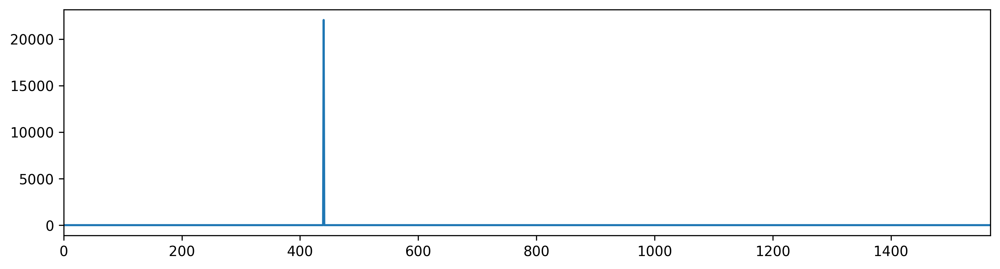

In [17]:
noteA = SoundWave(*generate_note(notes['A'], 1)) # '*' is the unpacking operator
Fmax = notes['G']*2
noteA.plot(DFT=True, Fmax = Fmax)

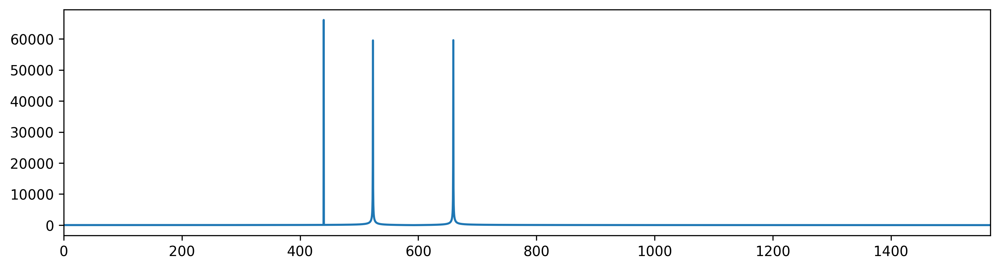

In [18]:
noteAm.plot(DFT=True, Fmax = Fmax)

### Problem 1.8

Use the DFT to determine the individual notes that are present in `mystery_chord.wav`.

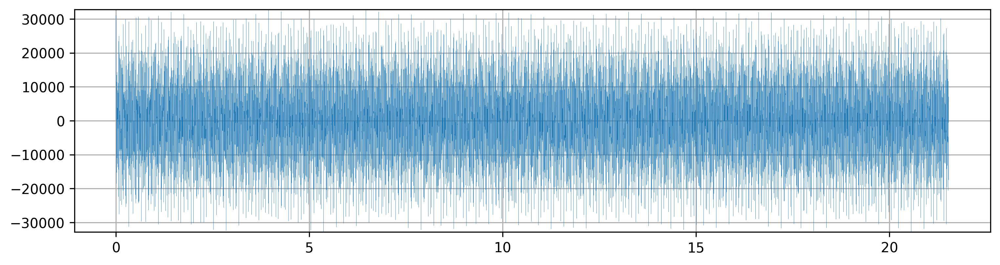

In [19]:
wave = SoundWave(*wavfile.read("mystery_chord.wav"))
wave.plot()
IPython.display.Audio(wave.samples, rate=wave.rate)

(array([440.25, 523.5 , 587.75, 784.25]),
 {'A': 440,
  'B': 493.88,
  'C': 523.25,
  'D': 587.33,
  'E': 659.25,
  'F': 698.46,
  'G': 783.99})

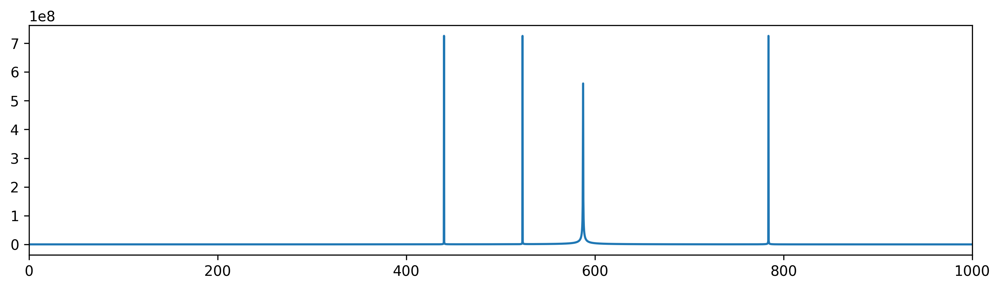

In [20]:
wave.plot(DFT=True,Fmax=1000)

# Get FFT
F = fft(wave.samples)
f = np.arange(len(wave.samples)) * wave.rate/len(wave.samples)

# Set Noise Floor Threshold
threshold = max(abs(F))/2
Ft = abs(F)>threshold

# Find Center Frequenies
freq = []
edgeDetected = False
f0 = 0
f1 = 0
for i, Ft in enumerate(Ft): # falling edge (think about a better way)
    if (edgeDetected == False and Ft == True):
        edgeDetected = True
        f0 = i
    if (edgeDetected == True and Ft == False):
        edgeDetected = False
        f1 = i
        ii = int((f0+f1)/2) # Average to closest centeral index
        if (i < len(wave.samples) * (wave.rate/2) / len(wave.samples)): # Nyquist
            freq.append(i)
        
#plt.plot(f,Ft*1e8)    
freq = np.array(freq) * wave.rate/len(wave.samples) # convert indexes to freqs
freq, notes

The notes are...

In [21]:
# Find notes
chord = []
fthreshold = 1 # hz
for ft in freq:
    for note in notes.keys():
        fv = notes[note]
        if (abs(ft-fv) < fthreshold):
            #print(note)
            chord.append(note)
print(f'The notes are {chord}, thus Am11.')
# see also, https://www.scales-chords.com/chord-namer/?notes=A;C;D;G&key=&bass=

The notes are ['A', 'C', 'D', 'G'], thus Am11.


<h2 align="center">Part 2: Convolution and Filtering.</h2>

### Problem 2.1

- Implement `SoundWave.__mul__()` for circular convolution.
- Generate 2 seconds of white noise at the same sample rate as `tada.wav`.
- Compute the circular convolution of `tada.wav` and the white noise. Embed the result in the notebook.
- Append the circular convolution to itself and embed the result in the notebook.

In [43]:
tada = SoundWave(*wavfile.read("tada.wav"))
noise = SoundWave(tada.rate, np.random.randint(-32768, 32767, tada.rate*2, dtype=np.int16))
#noise.plot()
conv = tada * noise
IPython.display.Audio(conv.samples, rate=conv.rate)

In [44]:
aconv = conv >> conv
IPython.display.Audio(aconv.samples, rate=aconv.rate)

### Problem 2.2

- Implement `SoundWave.__pow__()` for linear convolution.
- Time the linear convolution of `CGC.wav` and `GCG.wav` using `SoundWave.__pow__()` and `scipy.signal.fftconvolve()`.
- Embed the two original sounds and their convolutions in the notebook. Check that the convolutions with `SoundWave.__pow__()` and `scipy.signal.fftconvolve()` sound the same.

In [24]:
cgc = SoundWave(*wavfile.read("CGC.wav"))
IPython.display.Audio(cgc.samples, rate=cgc.rate)

In [25]:
t0 = time.time()
Lcgc1 = cgc**cgc
T1 = time.time() - t0

t0 = time.time()
Lcgc2 = SoundWave(Lcgc1.rate, fftconvolve(cgc.samples,cgc.samples))
T2 = time.time() - t0
print(f'T1: {round(T1,3)}s (SoundWave)\nT2: {round(T2,3)}s (fftconvolve)')

T1: 0.105s (SoundWave)
T2: 0.038s (fftconvolve)


In [26]:
IPython.display.Audio(Lcgc1.samples, rate=Lcgc1.rate)

In [27]:
IPython.display.Audio(Lcgc2.samples, rate=Lcgc2.rate)

In [28]:
len(cgc.samples), len(Lcgc1.samples), len(Lcgc2.samples)

(132300, 264599, 264599)

### Problem 2.3

Use `SoundWave.__pow__()` or `scipy.signal.fftconvolve()` to compute the linear convolution of `chopin.wav` and `balloon.wav`.
Embed the two original sounds and their convolution in the notebook.

In [29]:
w1 = SoundWave(*wavfile.read("chopin.wav"))
w2 = SoundWave(*wavfile.read("balloon.wav"))

In [30]:
IPython.display.Audio(w1.samples, rate=w1.rate)

In [31]:
IPython.display.Audio(w2.samples, rate=w2.rate)

In [32]:
cw = w1**w2
IPython.display.Audio(cw.samples, rate=cw.rate)

### Problem 2.4

- Implement `SoundWave.clean()`.
- Clean `noisy1.wav` by filtering out frequencies from $1250$-$2600$ Hz. Embed the original and the cleaned versions in the notebook.
- Clean `noisy2.wav`. Embed the original and the cleaned versions in the notebook.

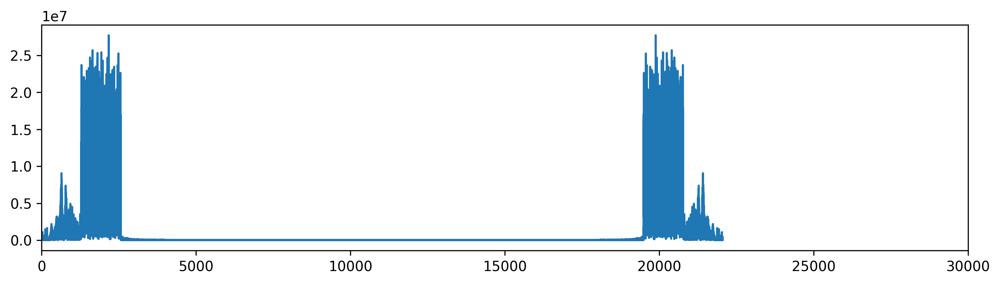

In [33]:
n1 = SoundWave(*wavfile.read("noisy1.wav"))
n1.plot(DFT=True, Fmax = 30000)
IPython.display.Audio(n1.samples, rate=n1.rate)

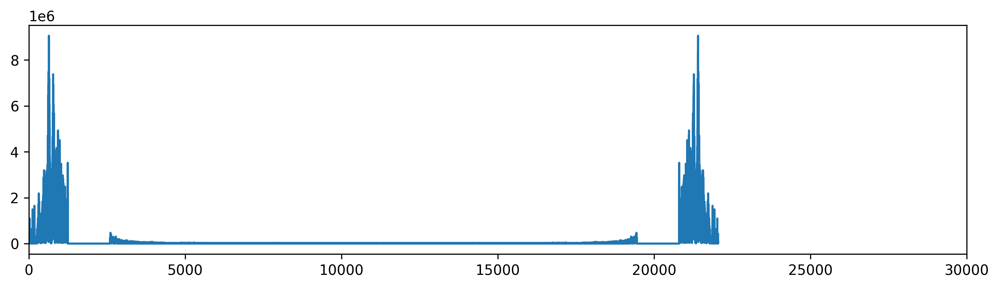

In [34]:
n1.clean(1250,2600)
n1.plot(DFT=True, Fmax = 30000)
IPython.display.Audio(n1.samples, rate=n1.rate)

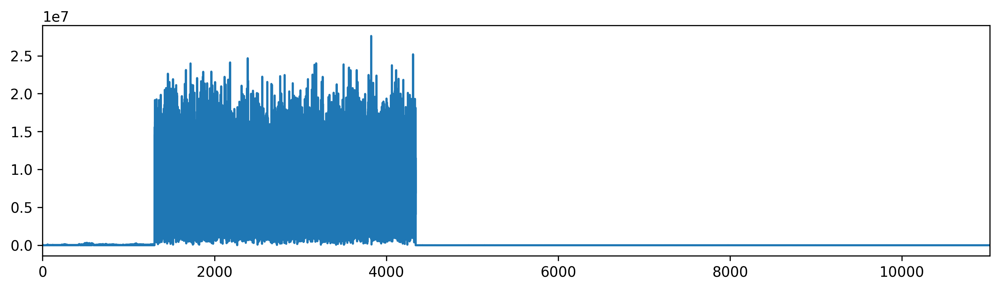

In [35]:
n2 = SoundWave(*wavfile.read("noisy2.wav"))
n2.plot(DFT=True)
IPython.display.Audio(n2.samples, rate=n2.rate)

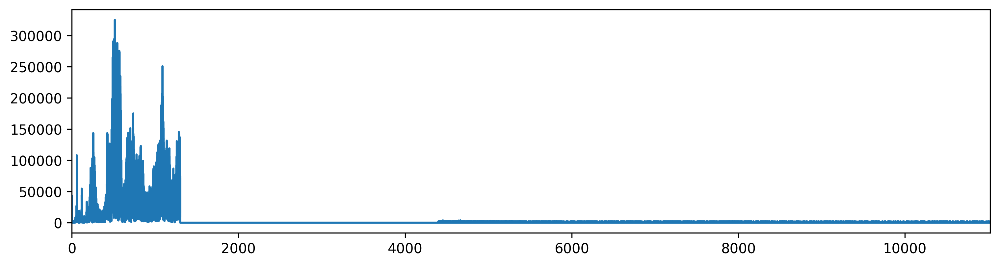

In [36]:
n2.clean(1300,4400)
n2.plot(DFT=True)
IPython.display.Audio(n2.samples, rate=n2.rate)

### Problem 2.5

- Clean `vuvuzela.wav` by filtering bad frequencies out of the left and right channels individually.
- Recombine the left and right channels and embed the result in the notebook.

In [37]:
rate, data = wavfile.read("vuvuzela.wav")
v1 = SoundWave(rate, data[:,0])
v2 = SoundWave(rate, data[:,1])
IPython.display.Audio([v1.samples,v2.samples], rate=v1.rate)

In [38]:
v1.clean(200,500)
v2.clean(200,500)
IPython.display.Audio([v1.samples,v2.samples], rate=v2.rate)

### Problem 2.6

- Clean up `license_plate.png` so that the year printed on the sticker in the bottom right corner of the plate is legible.
- Display the original and cleaned images.

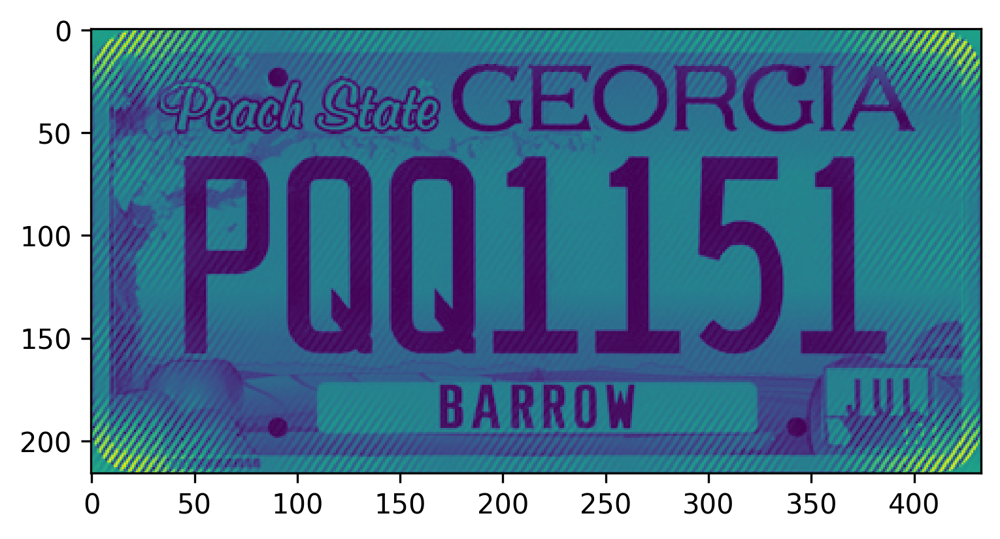

In [39]:
image = imageio.imread('license_plate.png')
plt.imshow(image)

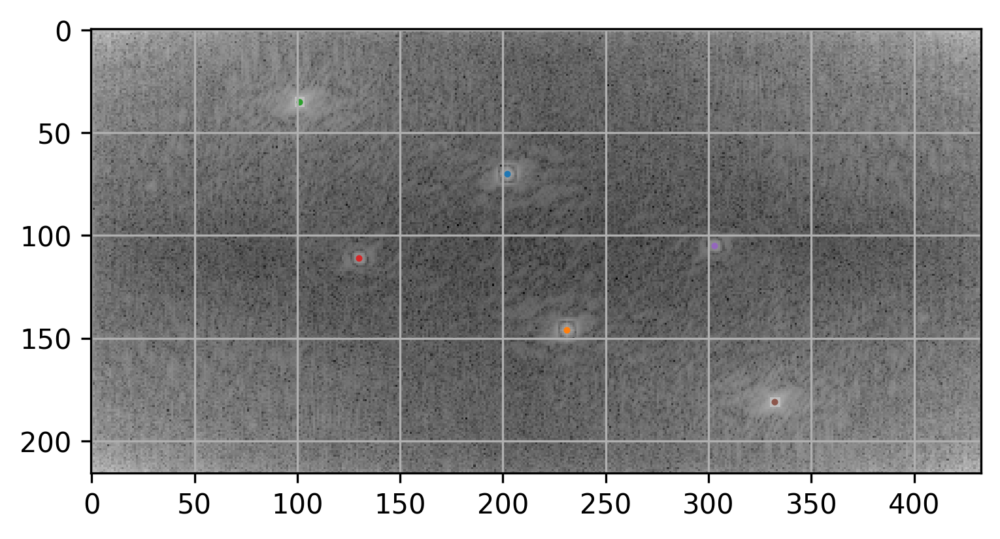

In [40]:
im_dft = fft2(image)
plt.imshow(np.log(np.abs(im_dft)), cmap='gray')
# major
plt.scatter(202,70, s=2)
plt.scatter(231,146, s=2)
#minor
plt.scatter(101,35, s=2)
plt.scatter(130,111, s=2)
plt.scatter(303,105, s=2)
plt.scatter(332,181, s=2)
plt.grid()

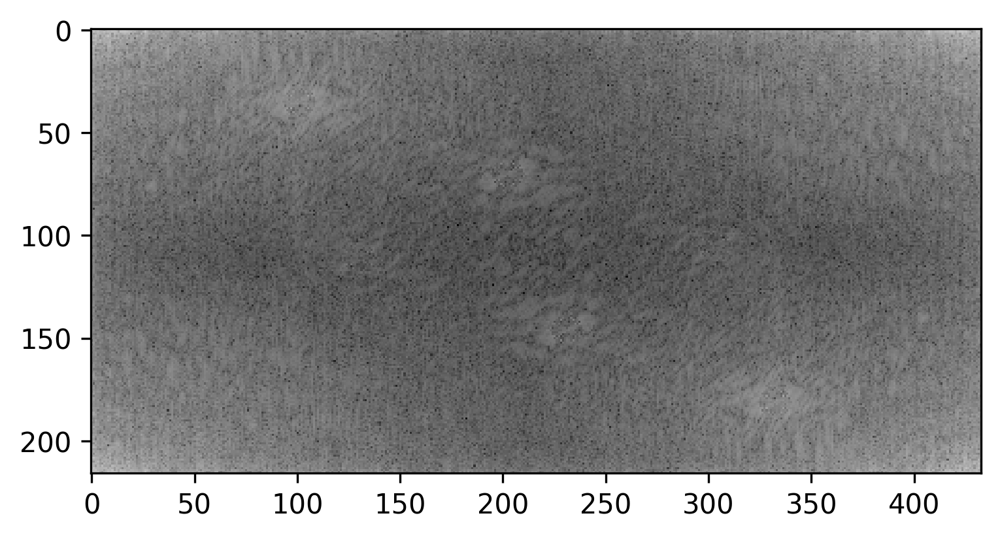

In [41]:
def patch(dft, y, x, s=17): # x and y are swapped for images
    # method find average at radius=s/2, fill square x,y w/avg
    l = []
    #print(f'{x},{y}:')
    for t in np.arange(0, 2*np.pi, np.pi/s):
        xx = int((s/2) * np.sin(t))+x
        yy = int((s/2) * np.cos(t))+y
        #print(f'({xx},{yy})')
        l.append(dft[xx,yy])
    v = np.mean(l)
    #print(v)
    
    if (True):
        for r in range(0,9):
            for t in np.arange(0, 2*np.pi, np.pi/s):
                xx = int(r * np.sin(t))+x
                yy = int(r * np.cos(t))+y
                xxx = int((r+s/2) * np.sin(t))+x
                yyy = int((r+s/2)* np.cos(t))+y
                dft[xx,yy] = dft[xxx,yyy]#v

    else:
        p = int(8/2)
        for xx in range(-p,p):
            for yy in range(-p,p):
                #print(f'{xx+x},{yy+y}')
                dft[xx+x, yy+y] = v/2

            
patch(im_dft, 202,70)
patch(im_dft, 231,146)
patch(im_dft,101,35)
patch(im_dft,130,111)
patch(im_dft,303,105)
patch(im_dft,332,181)

plt.imshow(np.log(np.abs(im_dft)), cmap='gray')

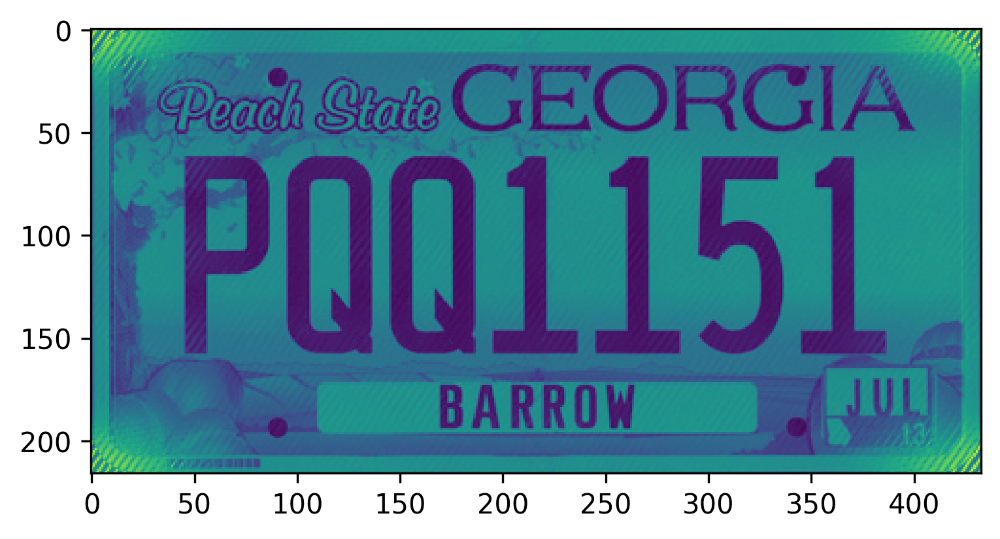

In [42]:
img = ifft2(im_dft).real
plt.imshow(img)

The year on the sticker is... 13